In [ ]:
import sys
!{sys.executable} -m pip install compress_pickle[lz4]

In [231]:
import os
import re
import csv
import json
import random
import numpy as np
np.int = np.int32
np.float = np.float64
np.bool = np.bool_

import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from langdetect import detect
from iso639 import languages
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import scipy
import math

# Set notebook mode to work in offline
pyo.init_notebook_mode()

import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from tldextract import extract
import matplotlib.cm as cm
  
import urllib.request as urlopen
from textwrap import wrap

from transformers import pipeline
import textstat
import pyLDAvis
from biterm.cbtm import oBTM 
from sklearn.feature_extraction.text import CountVectorizer
from biterm.utility import vec_to_biterms, topic_summuary # helper functions

import compress_pickle as pickle
from tqdm import tqdm

# Load dataset

In [71]:
df_path = '/data/audioset/audioset.parquet'
df = pd.read_parquet(df_path)

df

,yt_id,yt_title,yt_description,yt_channel_url,yt_duration,yt_age_limit,yt_webpage_url,yt_categories,yt_tags,yt_release_timestamp,yt_upload_date,yt_original_url,yt_release_year,yt_language,wada_snr,audio_tags,transcript,langauge,music_info
0,AfuT9LQe9zc,Heigl Dishes on Oprah (CelebTV),"Mayleen Ramey, host of celebTV, brings you dai...",https://www.youtube.com/channel/UCRvaYTRi-IdWB...,159,0,https://www.youtube.com/watch?v=AfuT9LQe9zc,['Entertainment'],"['mayleen', 'ramey', 'katherine', 'heigl', 'op...",nan,20081202,https://www.youtube.com/watch?v=AfuT9LQe9zc,nan,en,[12.789712 12.789712 12.789712 ... 12.789712 1...,"[('Music', 1.0), ('Speech', 1.0)]",It's already been a banner year for the Grey ...,en,{}
1,m_uUUuZ69v4,"Beatles, Blues & Blue Violin - Rock 'n' Roll I...",A pretty straight cover version of the 1983 EL...,https://www.youtube.com/channel/UCA66Q8ruGCJgP...,184,0,https://www.youtube.com/watch?v=m_uUUuZ69v4,['Music'],"['Beatles', 'Blue', 'Violin', 'Rock', 'Roll', ...",nan,20100912,https://www.youtube.com/watch?v=m_uUUuZ69v4,nan,None,[-20. -20. -20. ... -20. -20. -20.],"[('Music', 1.0), ('Musical instrument', 1.0), ...",I rock and roll and she plays it all night lo...,en,{}
2,hxea2eY1I-E,Leiya is shifting the Pajero Mini.,Leiya is shifting the Pajero Mini for the last...,https://www.youtube.com/channel/UCw3a5V2sniPOH...,171,0,https://www.youtube.com/watch?v=hxea2eY1I-E,['People & Blogs'],['Driving'],nan,20090318,https://www.youtube.com/watch?v=hxea2eY1I-E,nan,en,[28.719385 28.719385 28.719385 ... 28.719385 2...,"[('Vehicle', 1.0), ('Car', 1.0)]",Can I move? Hey! Otsu Gakusan! Hi!,en,None
3,_Cdax6Nyr9M,[ENG SUB] Mickey Mouse Club - Eunhyuk talks ab...,Subbed by miheexp | Raw video credit yuzuuki\n...,https://www.youtube.com/channel/UC6rNxtqmBadn-...,77,0,https://www.youtube.com/watch?v=_Cdax6Nyr9M,['Entertainment'],"['Super Junior', 'SJ', '슈퍼주니어', '은혁', 'D&E', '...",nan,20151210,https://www.youtube.com/watch?v=_Cdax6Nyr9M,nan,ko,[-0.8659032 -0.8659032 -0.8659032 ... -0.86590...,"[('Music', 1.0), ('Speech', 1.0)]",햄버거도 사주고 길에서 만두도 사주고 차비도 가끔 내주고 이렇게 좋은 형이 있었기...,ko,{}
4,sI6HVnz6Wq0,Behind the Green Door Theme Song (Original Mov...,The ORIGINAL version of a song that played dur...,https://www.youtube.com/channel/UC2BWuzpVKT0jE...,205,18,https://www.youtube.com/watch?v=sI6HVnz6Wq0,['Film & Animation'],"['Behind the Green Door', 'Theme', 'Marilyn ch...",nan,20150214,https://www.youtube.com/watch?v=sI6HVnz6Wq0,nan,None,[17.875134 17.875134 17.875134 ... 17.875134 1...,"[('Music', 1.0)]",.,en,{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9070,7DLSQatsq0E,"""Why I Love Working At Bell""",To learn more about career opportunities with ...,https://www.youtube.com/channel/UC-P61JcBfDjH_...,258,0,https://www.youtube.com/watch?v=7DLSQatsq0E,['People & Blogs'],"['TalentEgg', 'student', 'graduate', 'grad', '...",nan,20140626,https://www.youtube.com/watch?v=7DLSQatsq0E,nan,en,[8.259785 8.259786 8.259786 ... 8.259786 8.259...,"[('Music', 1.0), ('Speech', 1.0)]",My name is Judy Chang and I went to the Richa...,en,{}
9071,L6u0jpxStWs,Talking baby laughing & sneezing,Our 3 month old son jabber'n away with his mommy,https://www.youtube.com/channel/UCGcnY0pueGwbe...,109,0,https://www.youtube.com/watch?v=L6u0jpxStWs,['Entertainment'],"['baby', 'talking', 'sneezing', 'laughing', 's...",nan,20120317,https://www.youtube.com/watch?v=L6u0jpxStWs,nan,None,[14.021801 14.021801 14.021801 ... 14.021801 1...,"[('Laughter', 1.0), ('Speech', 1.0)]","Whoa, what was that?",en,None
9072,rU0901Jw2oM,2013 F150 Ecoboost 3.5L Stainless Works Chambe...,Check out the installation and sound clips of ...,https://www.youtube.com/channel/UCAPAKBjRCrg6-...,175,0,https://www.youtube.com/watch?v=rU0901Jw2oM,['Autos & Vehicles'],"['Stainless Works Exhaust', 'Ford EcoBoost Eng...",nan,20131021,https://www.youtube.com/watch?v=rU0901Jw2oM,nan,None,[12.131096 12.131096 12.131096 ... 12.131096 1...,"[('Music', 1.0)]",.,en,{}
9073,1weSkXpP7eQ

In [127]:
df['yt_duration'] = pd.to_numeric(df['yt_duration'])
df['yt_upload_year'] = df['yt_upload_date'].apply(lambda x: int(x[:4]))

In [82]:
def get_full_lang(lang):
    full_lang = None
    if lang == 'None':
        return full_lang

    try:
        full_lang = languages.get(alpha2=lang).name
    except Exception as e:
        if lang == 'jw':
            full_lang = 'Javanese'
        elif lang == 'haw':
            full_lang = 'Hawaiian'
        elif lang == 'iw':
            full_lang = 'Modern Hebrew'
        else:
            print(lang, e)
    return full_lang

df['full_language'] = df['langauge'].apply(get_full_lang)
df['yt_full_language'] = df['yt_language'].apply(get_full_lang)

# Basic analysis

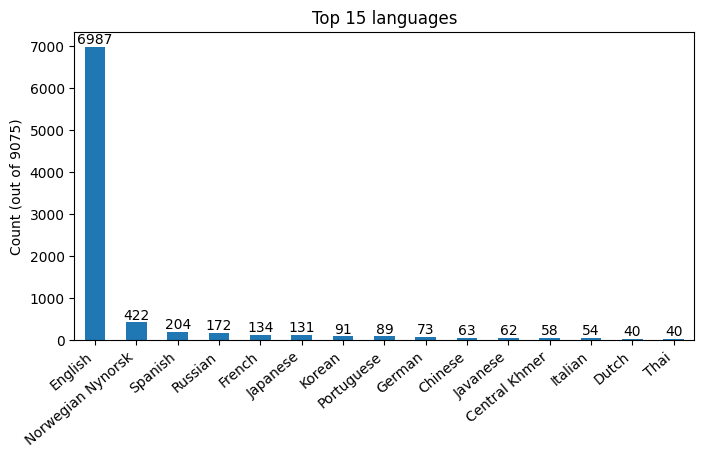

In [96]:
barplot = df['full_language'].value_counts()[:15].plot(kind='bar', figsize=(8, 4))

plt.title('Top 15 languages')
plt.ylabel('Count (out of 9075)')
plt.bar_label(barplot.containers[0],)
plt.xticks(rotation=40, ha='right')
plt.show()

In [84]:
print(df['yt_full_language'].value_counts())

English          3221
Spanish           221
French            113
Korean             70
Dutch              66
Hindi              62
Portuguese         58
Russian            56
Arabic             53
Indonesian         47
German             46
Japanese           41
Vietnamese         35
Italian            34
Turkish            14
Ukrainian          11
Modern Hebrew       3
Name: yt_full_language, dtype: int64


9075


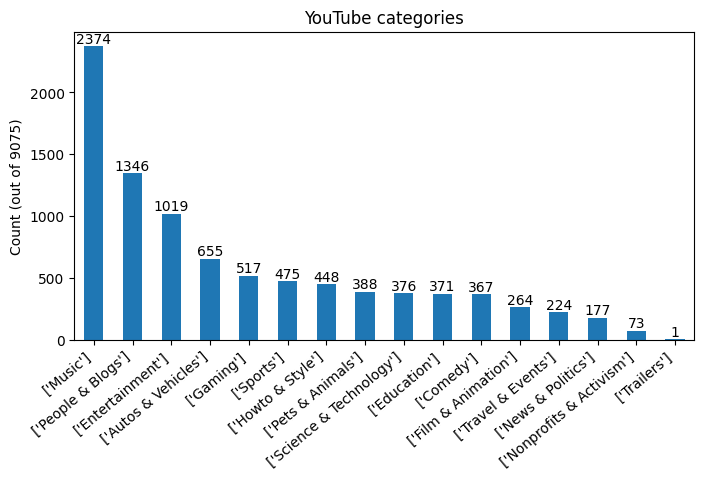

In [128]:
barplot = df['yt_categories'].value_counts().plot(kind='bar', figsize=(8, 4))

print(sum(df['yt_categories'].value_counts()))

plt.title('YouTube categories')
plt.ylabel('Count (out of 9075)')
plt.bar_label(barplot.containers[0],)
plt.xticks(rotation=40, ha='right')
plt.show()

In [102]:
len(df['yt_channel_url'].unique())

8925

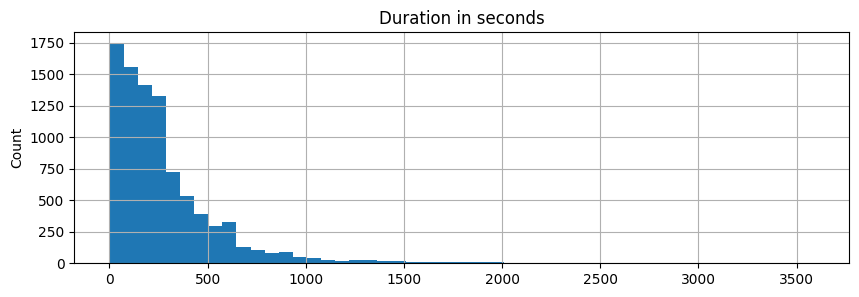

In [113]:
df['yt_duration'].hist(bins=50, figsize=(10, 3))
plt.title('Duration in seconds')
plt.ylabel('Count')
plt.show()

9075


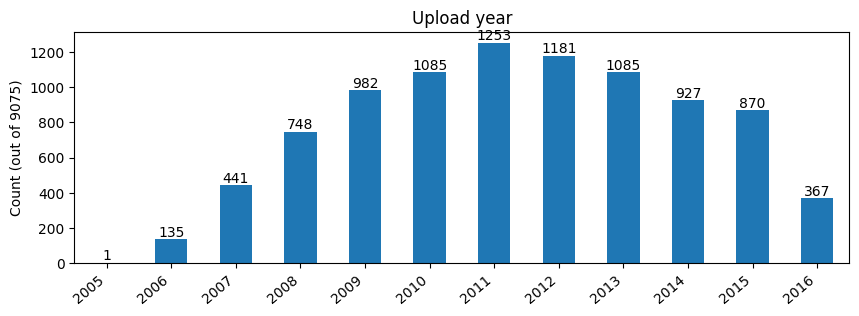

In [133]:
barplot = df['yt_upload_year'].value_counts().sort_index().plot(kind='bar', figsize=(10, 3))

print(sum(df['yt_upload_year'].value_counts()))

plt.title('Upload year')
plt.ylabel('Count (out of 9075)')
plt.bar_label(barplot.containers[0],)
plt.xticks(rotation=40, ha='right')
plt.show()

In [165]:
audio_type_freq = defaultdict(int)

for tags in df['audio_tags'].to_list():
    tags_list = tags[2:-2].split('), (')
    for tag in tags_list:
        audio_type = tag.split(', ')[0].replace("'", "")
        audio_type_freq[audio_type] += 1
audio_type_freq

defaultdict(int,
            {'Music': 4396,
             'Speech': 4457,
             'Musical instrument': 562,
             'Violin': 148,
             'Pizzicato': 20,
             'Vehicle': 588,
             'Car': 191,
             'Boat': 64,
             'Motorboat': 44,
             'Afrobeat': 8,
             'Spray': 16,
             'Guitar': 243,
             'Psychedelic rock': 10,
             'Plucked string instrument': 220,
             'Crow': 6,
             'Music of Latin America': 26,
             'Drum': 92,
             'Percussion': 77,
             'Rapping': 17,
             'Hip hop music': 29,
             'Alarm clock': 2,
             'Inside': 482,
             'Sailboat': 12,
             'Sampler': 29,
             'Marimba': 26,
             'Glockenspiel': 17,
             'Mallet percussion': 14,
             'Bee': 15,
             'Insect': 18,
             'Fly': 8,
             'Drill': 12,
             'Tools': 40,
             'Brass instrum

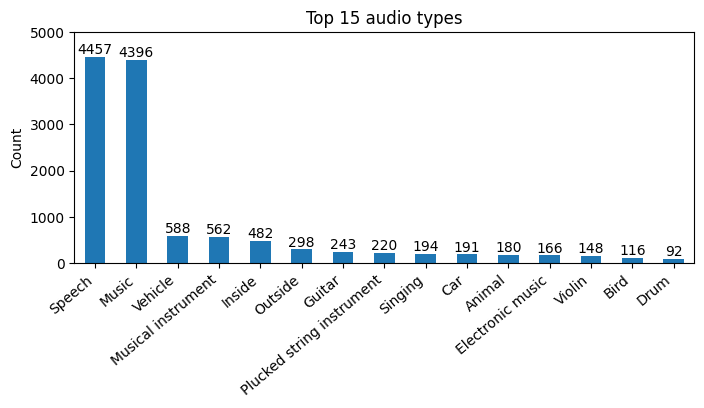

In [173]:
sorted_audio_type_freq = {
    k: v for k, v in sorted(audio_type_freq.items(), key=lambda item: item[1], reverse=True)
}
sorted_audio_types = list(sorted_audio_type_freq.keys())
sorted_counts = list(sorted_audio_type_freq.values())

top_num = 15

plot_df = pd.DataFrame({
    'audio_type': sorted_audio_types[:top_num],
    'count': sorted_counts[:top_num],
})

barplot = plot_df.sort_values('count', ascending=False).plot(
    kind='bar',y='count',x='audio_type', legend=False,
    figsize=(8, 3)
)
plt.title('Top 15 audio types')
plt.xlabel('')
plt.ylabel('Count')
plt.xticks(rotation=40, ha='right')
plt.bar_label(barplot.containers[0])
plt.ylim(0, 5000)
plt.show()

# Identity keywords

In [180]:
GENDER_LABELS = {
    'woman': [
        r'\bwom[ae]n\b',
        r'\bfemales?\b',
        r'\b(she|her|hers)\b',
    ],
    'man': [
        r'\bm[ae]n\b',
        r'\bmales?\b',
        r'\b(he|him|his)\b',
    ]
}

identity_keywords_dict = {
    'gender': [
        r'\bwom[ae]n\b',
        r'\bfemales?\b',
        r'\bm[ae]n\b',
        r'\bmales?\b',
        r'\bnon[ -]?binary\b',
        r'\btrans(|\+|gender)\b',
        
#         r'\b(she|her|hers)\b',
#         r'\b(he|him|his)\b',
#         r'\b(they|them|theirs)\b',
    ],
    'sexual_orientation': [
        r'\bhomosexuals?\b',
        r'\bgays?\b',
        r'\blesbians?\b',
        r'\bstraights?\b',
        r'\bheterosexuals?\b',
        r'\bbi-?sexuals?\b',
    ],
    'race': [
        r'\bblacks?\b',
        r'\bafrican([ -]american)?s?\b',
        r'\blatin[oax]?s?\b',
        r'\basian([ -]american)?s?\b',
        r'\bwhites?\b',
        r'\bcaucasians?\b',
        r'\beuropean([ -]american)?s?\b',
    ],
    'religion': [
        r'\bmuslims?\b',
        r'\bjew(|s|ish)?\b',
        r'\bchristians?\b',
    ]   
}

demographics = list(identity_keywords_dict.keys())

identity_keywords = []
for d in identity_keywords_dict:
    for keyword in identity_keywords_dict[d]:
        identity_keywords.append(keyword)
print(identity_keywords)

['\\bwom[ae]n\\b', '\\bfemales?\\b', '\\bm[ae]n\\b', '\\bmales?\\b', '\\bnon[ -]?binary\\b', '\\btrans(|\\+|gender)\\b', '\\bhomosexuals?\\b', '\\bgays?\\b', '\\blesbians?\\b', '\\bstraights?\\b', '\\bheterosexuals?\\b', '\\bbi-?sexuals?\\b', '\\bblacks?\\b', '\\bafrican([ -]american)?s?\\b', '\\blatin[oax]?s?\\b', '\\basian([ -]american)?s?\\b', '\\bwhites?\\b', '\\bcaucasians?\\b', '\\beuropean([ -]american)?s?\\b', '\\bmuslims?\\b', '\\bjew(|s|ish)?\\b', '\\bchristians?\\b']


In [246]:
transcripts = df['transcript'].to_list() # yt_title
ids = df['yt_id'].to_list()

In [247]:
keyword_dict = {}
keyword_to_ids = {}
keyword_to_transcripts = {}

for keyword in identity_keywords:
    print(str(keyword))
    regexp = re.compile(keyword, flags=re.IGNORECASE)
    keyword_dict[keyword] = 0
    keyword_to_ids[keyword] = []
    keyword_to_transcripts[keyword] = []

    for i, transcript in enumerate(transcripts):
        if regexp.search(transcript):
            keyword_dict[keyword] += 1
            keyword_to_ids[keyword].append(ids[i])
            keyword_to_transcripts[keyword].append(transcript)

\bwom[ae]n\b
\bfemales?\b
\bm[ae]n\b
\bmales?\b
\bnon[ -]?binary\b
\btrans(|\+|gender)\b
\bhomosexuals?\b
\bgays?\b
\blesbians?\b
\bstraights?\b
\bheterosexuals?\b
\bbi-?sexuals?\b
\bblacks?\b
\bafrican([ -]american)?s?\b
\blatin[oax]?s?\b
\basian([ -]american)?s?\b
\bwhites?\b
\bcaucasians?\b
\beuropean([ -]american)?s?\b
\bmuslims?\b
\bjew(|s|ish)?\b
\bchristians?\b


In [248]:
for keyword in keyword_to_transcripts:
    print('--------------------------------')
    print(keyword[2:-2])
    for t in keyword_to_transcripts[keyword]:
        print(t)

--------------------------------
wom[ae]n
 that woman had to the order and you you're an idiot no but i didn't come in here first because i didn't know the order
 To quote from one of her memorable movies, she is quite simply out of sight. This is a woman.
 This is Elsa's Women. Hmmmm. Hi. I'm Elsa.
 to help integrate immigrant women and to get them acquainted with the language. That was the goal. It gives them some time off.
 Oh, Mrs Whittington. Oh, makes your heart bleed for that poor dear dick she married. Strange little woman, isn't she? She reminds me rather of my mother.
 I will miss about Notre Dame women's basketball. 25. Sorry, I'm taking some offense minutes. The enlightening
 A gift from God this woman I don't need another leader Cause she's there when I need her She was there when I need her And she's all I ever needed This goes out to every man
 There's another man over there That woman of culture love Sweet woman of culture love She owns my mind
 Quite a bit like Kim. It

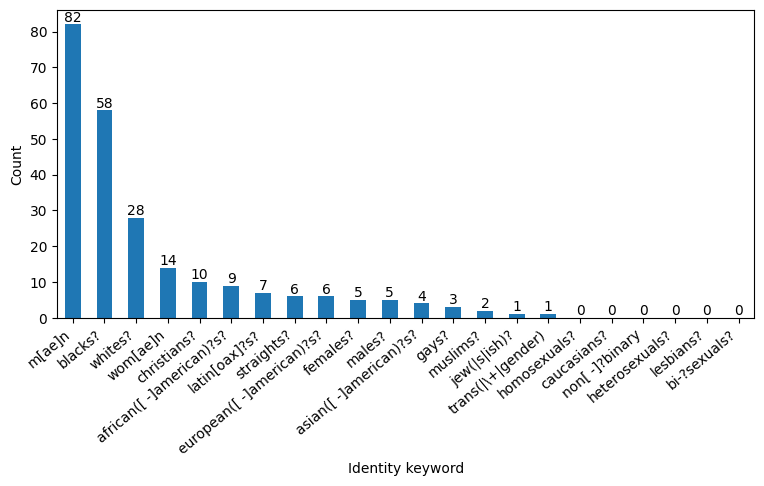

In [220]:
x = [k[2:-2] for k in keyword_dict]
raw_nums = keyword_dict.values()

plot_df = pd.DataFrame({'keyword': x, 'count': raw_nums})
barplot = plot_df.sort_values('count', ascending=False).plot(
    kind='bar',y='count',x='keyword', legend=False,
    figsize=(9, 4)
)
plt.xlabel('Identity keyword')
plt.ylabel('Count')
plt.xticks(rotation=40, ha='right')
plt.bar_label(barplot.containers[0])
plt.show()

## Gender

# Word clouds

In [227]:
pattern = re.compile(r'[^A-Za-z ]+')

def clean_caption(caption, as_set=False):
    # only return unique words in caption
    cleaned_caption = pattern.sub('', caption.lower())
    if as_set:
        return set(cleaned_caption.split(' '))
    else:
        return cleaned_caption

def get_wordclouds(transcripts):
    cleaned_transcripts = []
    for transcript in transcripts:
        cleaned_transcripts.append(' '.join(clean_caption(transcript, as_set=True)))

    fig, ax = plt.subplots(figsize=(20,12))
    wordcloud = WordCloud(width=800, height=400,
        background_color="white" # max_font_size=50, min_font_size=10, max_words=100
    ).generate(' '.join(cleaned_transcripts))
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off")
    plt.show()

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:523: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:523: DeprecationWarni

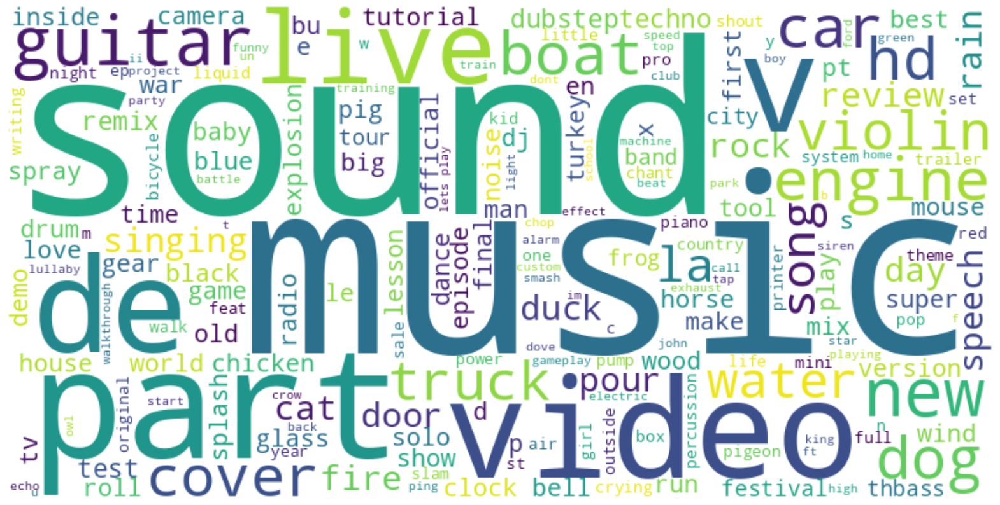

In [228]:
# overall
get_wordclouds(transcripts)

wom[ae]n


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarni

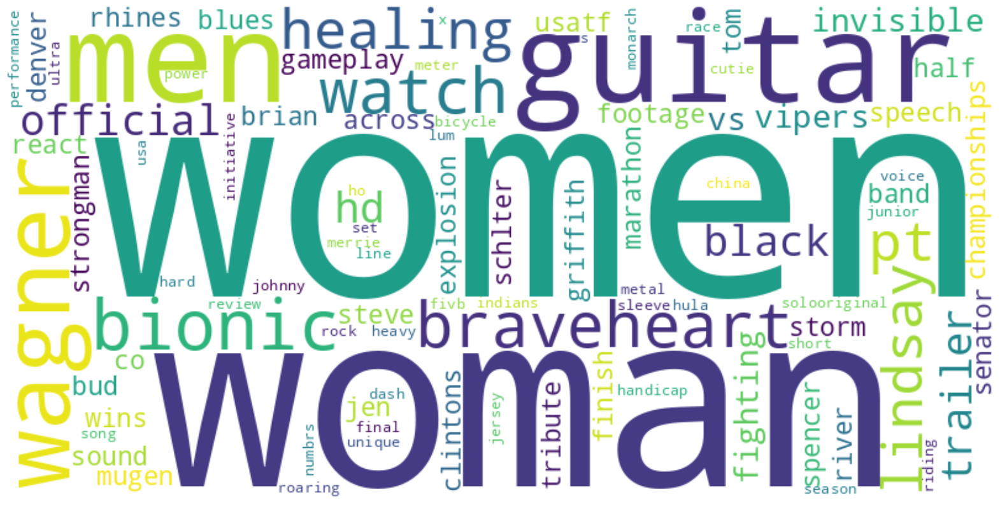

m[ae]n


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarni

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarni

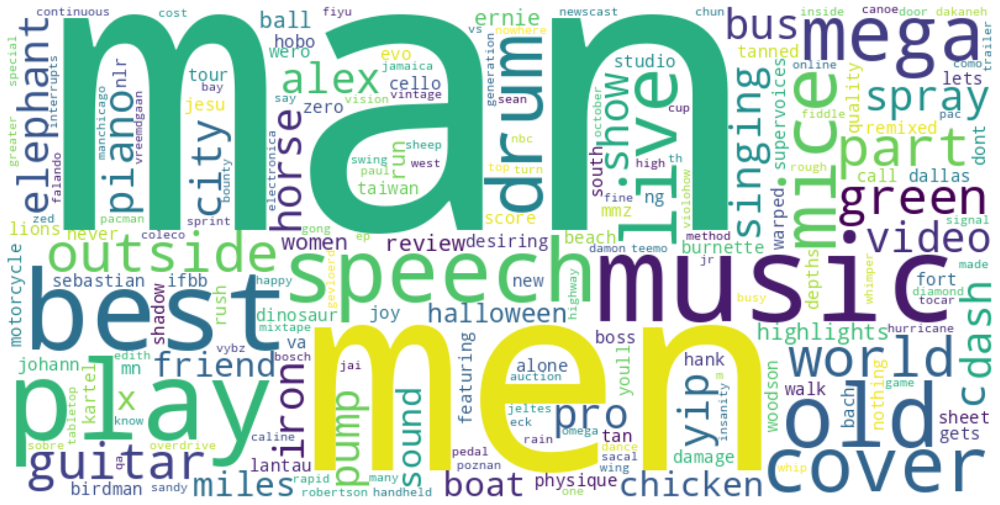

blacks?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarni

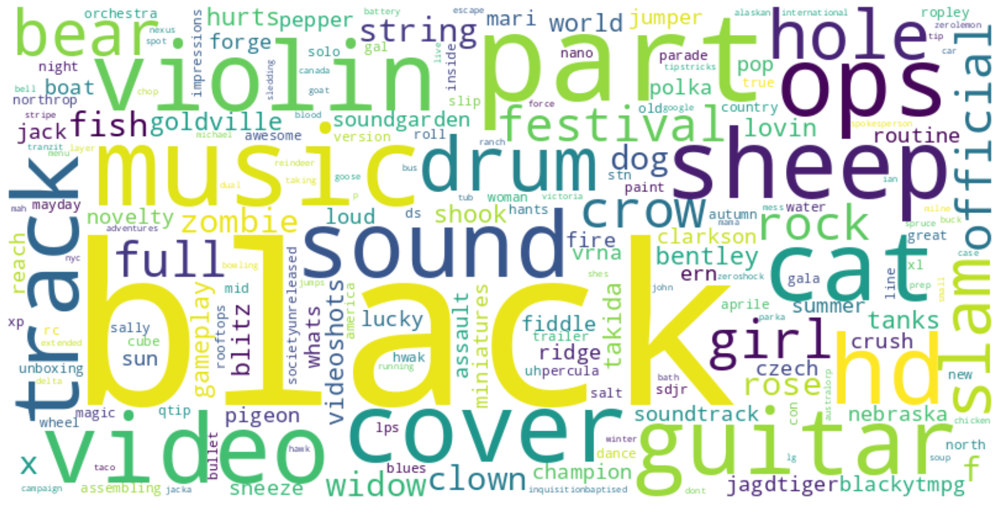

whites?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarni

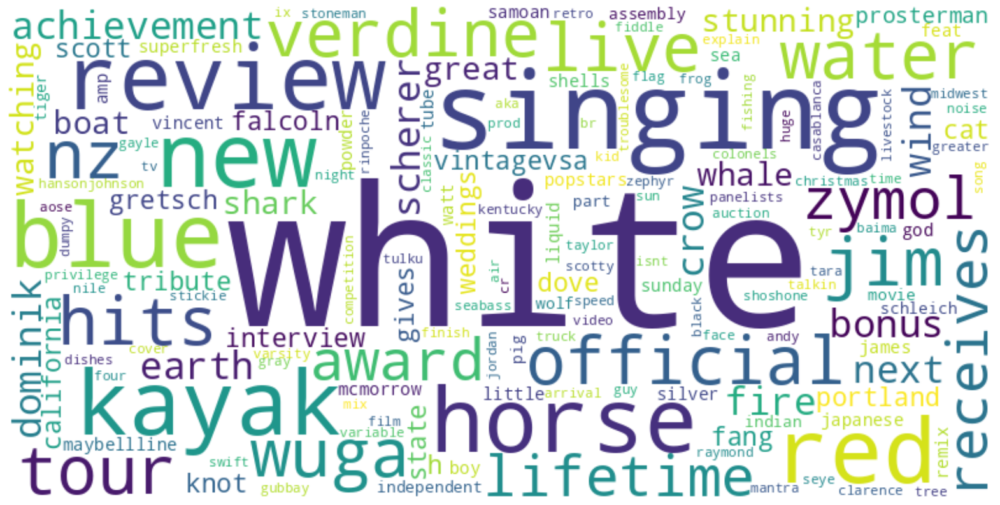

christians?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:522: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning:

ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/wordcloud/wordcloud.py:523: DeprecationWarni

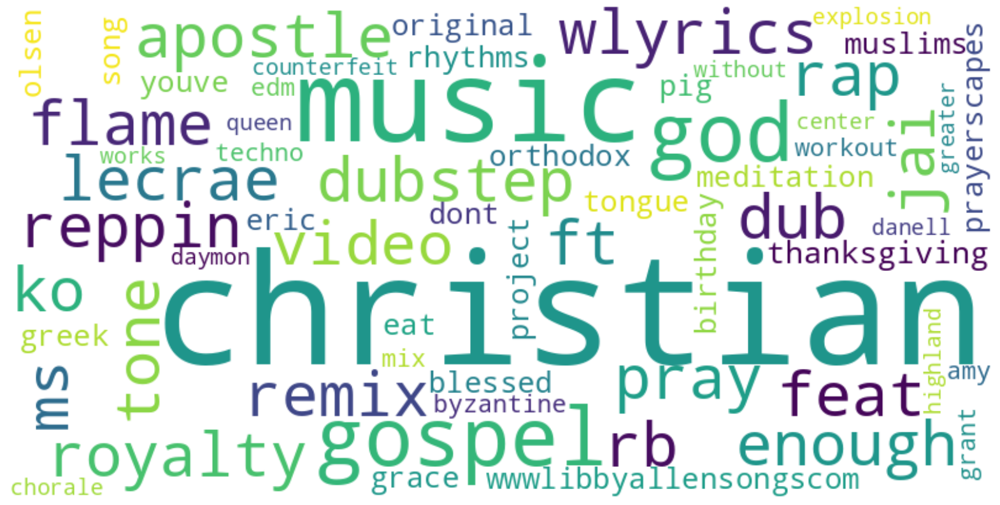

In [229]:
for keyword in keyword_to_transcripts:
    keyword_transcripts = keyword_to_transcripts[keyword]
    if len(keyword_transcripts) >= 10:
        print(keyword[2:-2])
        get_wordclouds(keyword_transcripts)

# Disk visualization

In [232]:
disk_df = px.data.tips()
disk_df['base'] = 'Test'
fig = px.sunburst(disk_df, path=['base', 'day', 'time', 'sex'])
fig.show()

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

In [244]:
# For each identity key word K1: do following for both filtered and excluded
# 1. Get count of top 10 words that appear with K1 by frequency in sample, ignoring STOPWORDS
# (word appear at least once in sample = 1 count)
# 2. For each of those words W1,
    # Get count of top 10 words that appear with K1 and W1 by frequency in sample, ignoring STOPWORDS
    # 3. For each of those words W2,
        # Get count of top 10 words that appear with K1 W1 W2 by frequency in sample, ignoring STOPWORDS
        # 4. For each of those words W3,
            # Get count of top 10 words that appear with K1 W1 W2 W3 by frequency in sample, ignoring STOPWORDS

def get_word_count(k_samples, words=[], top_num=25):
    # get word dict
    k_word_freq = defaultdict(int)
    for s in k_samples:
        intersect = all([w in s for w in words])
        if intersect or words == []:
            for word in s.split(' '):
                if word not in words and len(word) > 2:
                    if word.lower() not in STOPWORDS and not bool(re.search(r'\d', word)):
                        k_word_freq[word.lower()] += 1

    # sort word dict
    sorted_k_word_freq = {k: v for k, v in sorted(
        k_word_freq.items(), key=lambda item: item[1], reverse=True
    )}
    top_word_freq = dict(list(sorted_k_word_freq.items())[:top_num])
    return top_word_freq, sum([sorted_k_word_freq[k] for k in sorted_k_word_freq])

def make_disk_viz(transcripts, root=''):
    cleaned_transcripts = []
    for transcript in transcripts:
        cleaned_transcripts.append(' '.join(clean_caption(transcript, as_set=True)))

    fig = make_subplots(rows=1, cols=1, specs=[ [{"type": "sunburst"}] ])
    unique_words = set()

    k_list = []
    w1_list = []
    w2_list = []

    w1_freq, total_w1 = get_word_count(cleaned_transcripts)

    # for _ in range(total_w1 - sum([w1_freq[w] for w in w1_freq])):
    #     k_list.append(root)
    #     w1_list.append('_')
    #     w2_list.append('_')

    for w1 in w1_freq:
        unique_words.add(w1)

        w1_n = w1_freq[w1]
        w2_freq, total_w2 = get_word_count(k_samples, words=[w1], top_num=5)

        for w2 in w2_freq:
            unique_words.add(w2)

            w2_n = w2_freq[w2]
            for _ in range(w2_n):
                k_list.append(root)
                w1_list.append(w1)
                w2_list.append(w2)

    #     for _ in range(total_w2 - sum([w2_freq[w] for w in w2_freq])):
    #         k_list.append(root)
    #         w1_list.append(w1)
    #         w2_list.append('_')

    chart_df = pd.DataFrame({
        'k': k_list,
        'w1': w1_list,
        'w2': w2_list,
    })

    figaux = px.sunburst(
        chart_df,
        path=['k', 'w1', 'w2']
    )
    fig.add_trace(figaux.data[0], row=1, col=1)

    fig.show()


In [250]:
for keyword in keyword_to_transcripts:
    keyword_transcripts = keyword_to_transcripts[keyword]
    if len(keyword_transcripts) >= 10:
        print(keyword[2:-2])
        make_disk_viz(keyword_transcripts, root=keyword[2:-2])

wom[ae]n


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

m[ae]n


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

straights?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

blacks?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

whites?


/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anaconda3/envs/datacomp/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/home/hongrach/anacond

# Create dataset

In [65]:
data_dir="/data/audioset/audioset_downloads"

YT_KEYS = [
    'id', 'title', 'description', 'channel_url', 'duration', 'age_limit', 'webpage_url', 'original_url',
    'categories', 'tags', 'release_timestamp', 'release_year', 'upload_date', 'language'
]
KEYS = ['wada_snr', 'audio_tags', 'transcript', 'langauge', 'music_info']

In [ ]:
count = 0
for audio_info_file in tqdm(os.listdir(data_dir)):
    if audio_info_file[-4:]=='.lz4':
        try:
            audio_info=pickle.load(os.path.join(data_dir, audio_info_file))
            if isinstance(audio_info, dict):
                pass
            else:
                print(audio_info)
                count += 1
        except Exception as e:
            count += 1
count

In [67]:
info_dicts = []
for audio_info_file in tqdm(os.listdir(data_dir)):
    if audio_info_file[-4:]=='.lz4':
        try:
            audio_info=pickle.load(os.path.join(data_dir, audio_info_file))
            if isinstance(audio_info, dict):
                info_dict = {}
                for key in audio_info:
                    if key in KEYS:
                        info_dict[key] = audio_info[key]

                    for key in audio_info['yt_info']:
                        if key in YT_KEYS:
                            info_dict['yt_' + key] = audio_info['yt_info'][key]
                info_dicts.append(info_dict)
        except Exception as e:
            print("ERROR", e)

 67%|█████████████████████████████████████████████████████▉                           | 7259/10901 [01:34<00:43, 83.29it/s]

ERROR Compressed file ended before the end-of-stream marker was reached


100%|████████████████████████████████████████████████████████████████████████████████| 10901/10901 [02:20<00:00, 77.43it/s]


In [68]:
df = pd.DataFrame(info_dicts)

In [69]:
df

,yt_id,yt_title,yt_description,yt_channel_url,yt_duration,yt_age_limit,yt_webpage_url,yt_categories,yt_tags,yt_release_timestamp,yt_upload_date,yt_original_url,yt_release_year,yt_language,wada_snr,audio_tags,transcript,langauge,music_info
0,AfuT9LQe9zc,Heigl Dishes on Oprah (CelebTV),"Mayleen Ramey, host of celebTV, brings you dai...",https://www.youtube.com/channel/UCRvaYTRi-IdWB...,159,0,https://www.youtube.com/watch?v=AfuT9LQe9zc,[Entertainment],"[mayleen, ramey, katherine, heigl, oprah, cele...",NaN,20081202,https://www.youtube.com/watch?v=AfuT9LQe9zc,NaN,en,"[12.789712, 12.789712, 12.789712, 12.789712, 1...","[(Music, 1.0), (Speech, 1.0)]",It's already been a banner year for the Grey ...,en,{}
1,m_uUUuZ69v4,"Beatles, Blues & Blue Violin - Rock 'n' Roll I...",A pretty straight cover version of the 1983 EL...,https://www.youtube.com/channel/UCA66Q8ruGCJgP...,184,0,https://www.youtube.com/watch?v=m_uUUuZ69v4,[Music],"[Beatles, Blue, Violin, Rock, Roll, Is, King, ...",NaN,20100912,https://www.youtube.com/watch?v=m_uUUuZ69v4,NaN,None,"[-20.0, -20.0, -20.0, -20.0, -20.0, -20.0, -20...","[(Music, 1.0), (Musical instrument, 1.0), (Vio...",I rock and roll and she plays it all night lo...,en,{}
2,hxea2eY1I-E,Leiya is shifting the Pajero Mini.,Leiya is shifting the Pajero Mini for the last...,https://www.youtube.com/channel/UCw3a5V2sniPOH...,171,0,https://www.youtube.com/watch?v=hxea2eY1I-E,[People & Blogs],[Driving],NaN,20090318,https://www.youtube.com/watch?v=hxea2eY1I-E,NaN,en,"[28.719385, 28.719385, 28.719385, 28.719385, 2...","[(Vehicle, 1.0), (Car, 1.0)]",Can I move? Hey! Otsu Gakusan! Hi!,en,None
3,_Cdax6Nyr9M,[ENG SUB] Mickey Mouse Club - Eunhyuk talks ab...,Subbed by miheexp | Raw video credit yuzuuki\n...,https://www.youtube.com/channel/UC6rNxtqmBadn-...,77,0,https://www.youtube.com/watch?v=_Cdax6Nyr9M,[Entertainment],"[Super Junior, SJ, 슈퍼주니어, 은혁, D&E, 2015, 디앤이, ...",NaN,20151210,https://www.youtube.com/watch?v=_Cdax6Nyr9M,NaN,ko,"[-0.8659032, -0.8659032, -0.8659032, -0.865903...","[(Music, 1.0), (Speech, 1.0)]",햄버거도 사주고 길에서 만두도 사주고 차비도 가끔 내주고 이렇게 좋은 형이 있었기...,ko,{}
4,sI6HVnz6Wq0,Behind the Green Door Theme Song (Original Mov...,The ORIGINAL version of a song that played dur...,https://www.youtube.com/channel/UC2BWuzpVKT0jE...,205,18,https://www.youtube.com/watch?v=sI6HVnz6Wq0,[Film & Animation],"[Behind the Green Door, Theme, Marilyn chamber...",NaN,20150214,https://www.youtube.com/watch?v=sI6HVnz6Wq0,NaN,None,"[17.875134, 17.875134, 17.875134, 17.875135, 1...","[(Music, 1.0)]",.,en,{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9070,7DLSQatsq0E,"""Why I Love Working At Bell""",To learn more about career opportunities with ...,https://www.youtube.com/channel/UC-P61JcBfDjH_...,258,0,https://www.youtube.com/watch?v=7DLSQatsq0E,[People & Blogs],"[TalentEgg, student, graduate, grad, summer, j...",NaN,20140626,https://www.youtube.com/watch?v=7DLSQatsq0E,NaN,en,"[8.259785, 8.259786, 8.259786, 8.259786, 8.259...","[(Music, 1.0), (Speech, 1.0)]",My name is Judy Chang and I went to the Richa...,en,{}
9071,L6u0jpxStWs,Talking baby laughing & sneezing,Our 3 month old son jabber'n away with his mommy,https://www.youtube.com/channel/UCGcnY0pueGwbe...,109,0,https://www.youtube.com/watch?v=L6u0jpxStWs,[Entertainment],"[baby, talking, sneezing, laughing, smiling, c...",NaN,20120317,https://www.youtube.com/watch?v=L6u0jpxStWs,NaN,None,"[14.021801, 14.021801, 14.021801, 14.021801, 1...","[(Laughter, 1.0), (Speech, 1.0)]","Whoa, what was that?",en,None
9072,rU0901Jw2oM,2013 F150 Ecoboost 3.5L Stainless Works Chambe...,Check out the installation and sound clips of ...,https://www.youtube.com/channel/UCAPAKBjRCrg6-...,175,0,https://www.youtube.com/watch?v=rU0901Jw2oM,[Autos & Vehicles],"[Stainless Works Exhaust, Ford EcoBoost Engine...",NaN,20131021,https://www.youtube.com/watch?v=rU0901Jw2oM,NaN,None,"[12.131096, 12.131096, 12.131096, 12.131096, 1...","[(Music, 1.0)]",.,en,{}
9073,1weSkXpP7eQ,Moving dwar

In [70]:
df.astype(str).to_parquet('/data/audioset/audioset.parquet')

In [79]:
audio_info['yt_info'].keys()

dict_keys(['id', 'title', 'formats', 'thumbnails', 'thumbnail', 'description', 'channel_id', 'channel_url', 'duration', 'view_count', 'average_rating', 'age_limit', 'webpage_url', 'categories', 'tags', 'playable_in_embed', 'live_status', 'release_timestamp', '_format_sort_fields', 'automatic_captions', 'subtitles', 'comment_count', 'chapters', 'heatmap', 'like_count', 'channel', 'channel_follower_count', 'uploader', 'uploader_id', 'uploader_url', 'upload_date', 'availability', 'original_url', 'webpage_url_basename', 'webpage_url_domain', 'extractor', 'extractor_key', 'playlist', 'playlist_index', 'display_id', 'fulltitle', 'duration_string', 'release_year', 'is_live', 'was_live', 'requested_subtitles', '_has_drm', 'epoch', 'asr', 'filesize', 'format_id', 'format_note', 'source_preference', 'fps', 'audio_channels', 'height', 'quality', 'has_drm', 'tbr', 'filesize_approx', 'url', 'width', 'language', 'language_preference', 'preference', 'ext', 'vcodec', 'acodec', 'dynamic_range', 'contai

In [226]:
audio_info['yt_info']['automatic_captions']

{}